# Face Detection on Custom Dataset with Detectron2


## Detectron 2

[Detectron2](https://github.com/facebookresearch/detectron2) is a framework for building state-of-the-art object detection and image segmentation models. It is developed by the Facebook Research team. Detectron2 is a complete rewrite of the [first version](https://github.com/facebookresearch/Detectron).

Under the hood, Detectron2 uses PyTorch (compatible with the latest version(s)) and allows for [blazing fast training](https://detectron2.readthedocs.io/notes/benchmarks.html). You can learn more at [introductory blog post](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by Facebook Research.

The real power of Detectron2 lies in the HUGE amount of pre-trained models available at the [Model Zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). But what good that would it be if you can't fine-tune those on your own datasets? Fortunately, that's super easy! We'll see how it is done in this guide.

### Installing Detectron2

Installing some requirements:

In [1]:
!pip install -q cython pyyaml==6.0.1
#!pip install pycocotools==2.0.2
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Preparing metadata (setup.py) ... done


Download, compile, and install the Detectron2 package:

In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-wthtdpsj
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-wthtdpsj
  Resolved https://github.com/facebookresearch/detectron2.git to commit bce6d7262b1065498481be1d6708c8dbb142975a
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2

In [3]:
!pip install -q -U watermark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.7 MB/s eta 0:00:00


In [4]:
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 7.34.0

numpy      : 1.25.2
pandas     : 2.0.3
pycocotools: 2.0.7
torch      : 2.2.1+cu121
torchvision: 0.17.1+cu121
detectron2 : 0.6



In [5]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import glob

import os
import ntpath
import numpy as np
import cv2
import random
import itertools
import pandas as pd
from tqdm import tqdm
import urllib
import json
import PIL.Image as Image
import codecs

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

## Face Detection Data

Our dataset is provided by FDDB. The downloads to our dataset is below.


In [ ]:
@misc{
face-detection-40nq0_dataset,
title = { Face detection Dataset },
type = { Open Source Dataset },
author = { FDDB },
howpublished = { \url{ https://universe.roboflow.com/fddb/face-detection-40nq0 } },
url = { https://universe.roboflow.com/fddb/face-detection-40nq0 },
journal = { Roboflow Universe },
publisher = { Roboflow },
year = { 2022 },
month = { feb },
note = { visited on 2024-05-02 },
}

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

#_annotations.coco.json
!gdown --id 1uXd5jJUs8x5SbKJ4cP2O2Y2Kpvqd6n3c

#test photo
!gdown --id 1FpAJKufRKGTMvFkhdBggcV73MFvzwYvo #1 box
!gdown --id 1QAh8jfA5aInZN4i8XP3jF_61M6h9_cJm #2 boxes

Mounted at /content/drive/
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1uXd5jJUs8x5SbKJ4cP2O2Y2Kpvqd6n3c
To: /content/_annotations.coco.json
100% 14.2M/14.2M [00:00<00:00, 113MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1FpAJKufRKGTMvFkhdBggcV73MFvzwYvo
To: /content/0_Parade_marchingband_1_20_jpg.rf.1307ccd254920f8a6596ce0ca186c866.jpg
100% 44.3k/44.3k [00:00<00:00, 63.3MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You do

Each line contains a single face annotation. Note that multiple lines might point to a single image (e.g. multiple faces per image).

## Data Preprocessing


In [7]:
import json
os.makedirs("faces", exist_ok=True)


with open('_annotations.coco.json', 'r') as f:
    data = json.load(f)

# Extracting required information from JSON
images = data["images"]
annotations = data["annotations"]

# Initializing dataset
dataset = []

# Iterating through images
for image in images:
    image_name = image["file_name"]
    image_id = image["id"]
    width = image["width"]
    height = image["height"]

    # Finding annotations corresponding to this image
    image_annotations = [an for an in annotations if an["image_id"] == image_id]

    # Iterating through annotations
    for an in image_annotations:
        data = {}
        data['file_name'] = image_name
        data['width'] = width
        data['height'] = height

        # Extracting bounding box coordinates
        bbox = an["bbox"]
        data["x_min"] = int(bbox[0])
        data["y_min"] = int(bbox[1])
        data["x_max"] = int(bbox[0] + bbox[2]) if bbox[2] is not None else None
        data["y_max"] = int(bbox[1] + bbox[3]) if bbox[3] is not None else None

        data['class_name'] = 'face'  # Assuming all annotations represent faces
        data['image_id'] = an["image_id"]

        dataset.append(data)

num_annotations = len(dataset)
print("Number of annotations:", num_annotations)

Number of annotations: 41781


Converting data into a dataframe

In [8]:
df = pd.DataFrame(dataset)
print(df)

                                               file_name  width  height  \
0      18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...   1024    1038   
1      18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...   1024    1038   
2      img_680_jpg.rf.005e535e0a9ec17d0859422282d5781...    416     416   
3      img_680_jpg.rf.005e535e0a9ec17d0859422282d5781...    416     416   
4      35_Basketball_playingbasketball_35_276_jpg.rf....    416     416   
...                                                  ...    ...     ...   
41776  43_Row_Boat_Canoe_43_784_jpg.rf.443bedfe19108e...    416     416   
41777  43_Row_Boat_Canoe_43_784_jpg.rf.443bedfe19108e...    416     416   
41778  43_Row_Boat_Canoe_43_784_jpg.rf.443bedfe19108e...    416     416   
41779  43_Row_Boat_Canoe_43_784_jpg.rf.443bedfe19108e...    416     416   
41780  43_Row_Boat_Canoe_43_784_jpg.rf.443bedfe19108e...    416     416   

       x_min  y_min  x_max  y_max class_name  image_id  
0          0      0    NaN    NaN       fa

In [9]:
print(df.file_name.unique().shape[0], df.shape[0])

5196 41781


We have a total of 5196 images and 41781 annotations. Let's save them to the disk:

In [10]:
df.to_csv('_annotations.coco.csv', header=True, index=None)

In [11]:
print(images)

[{'id': 0, 'license': 1, 'file_name': '18_Concerts_Concerts_18_366_jpg.rf.009e25def2b1a3148d5126c14beab43f.jpg', 'height': 1038, 'width': 1024, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 1, 'license': 1, 'file_name': 'img_680_jpg.rf.005e535e0a9ec17d0859422282d57814.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 2, 'license': 1, 'file_name': '35_Basketball_playingbasketball_35_276_jpg.rf.00704d6e7ee5d2f7ef442746defd50ab.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 3, 'license': 1, 'file_name': 'img_496_jpg.rf.0097fc41bfa379eccfb8a99bb7a5ef6f.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 4, 'license': 1, 'file_name': '22_Picnic_Picnic_22_290_jpg.rf.00648326cc7d1f4ef3c3bb12434bc168.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 5, 'license': 1, 'file_name': '13_Interview_Interview_On_Location_13_334_jpg.rf.001

### Data Exploration
Sample annotated data. Ised OpenCV to load an image, add the bounding boxes, and resize it. We defined a helper function below.

In [12]:
print(df[df.file_name == df.file_name.unique()[0]])
print(type(images)
print(images)
print(type(images[0]["file_name"]))


                                           file_name  width  height  x_min  \
0  18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...   1024    1038      0   
1  18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...   1024    1038    235   

   y_min  x_max  y_max class_name  image_id  
0      0    NaN    NaN       face         0  
1     45  600.0  538.0       face         0  
<class 'list'>
[{'id': 0, 'license': 1, 'file_name': '18_Concerts_Concerts_18_366_jpg.rf.009e25def2b1a3148d5126c14beab43f.jpg', 'height': 1038, 'width': 1024, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 1, 'license': 1, 'file_name': 'img_680_jpg.rf.005e535e0a9ec17d0859422282d57814.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 2, 'license': 1, 'file_name': '35_Basketball_playingbasketball_35_276_jpg.rf.00704d6e7ee5d2f7ef442746defd50ab.jpg', 'height': 416, 'width': 416, 'date_captured': '2022-05-27T00:28:33+00:00'}, {'id': 3, 'license': 1, 'file_name': 'img_496_jpg.rf.0

In [31]:
def annotate_image(annotations, file_names, resize=True):
    file_name = file_names
    img_path = f'/content/drive/My Drive/OtherDataset/Facedetection.v1-fddb.coco/train/{file_name}'
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    for i, a in annotations.iterrows():
        # Check for NaN values in coordinates
        if pd.notna(a.x_min) and pd.notna(a.y_min) and pd.notna(a.x_max) and pd.notna(a.y_max):
            # Convert coordinates to integers
            x_min, y_min, x_max, y_max = int(a.x_min), int(a.y_min), int(a.x_max), int(a.y_max)
            # Draw rectangle only if coordinates are valid
            cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

    if not resize:
        return img

    return cv2.resize(img, (416, 416), interpolation=cv2.INTER_AREA)


file_name      object
width           int64
height          int64
x_min           int64
y_min           int64
x_max         float64
y_max         float64
class_name     object
image_id        int64
dtype: object
18_Concerts_Concerts_18_366_jpg.rf.009e25def2b1a3148d5126c14beab43f.jpg


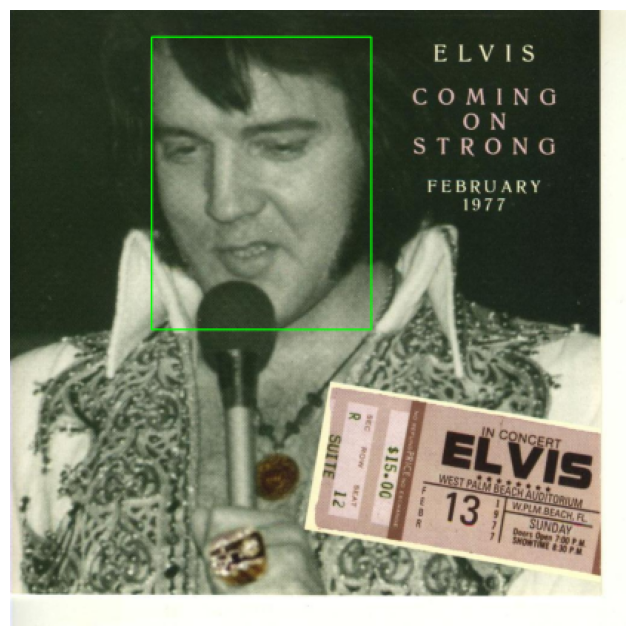

In [33]:
img_df = df[df.file_name == df.file_name.unique()[0]]
print(img_df.dtypes)
print(images[0]["file_name"])
img = annotate_image(img_df, images[0]["file_name"], resize=True)

# Display the image
plt.imshow(img)
plt.axis('off')
plt.show()

Let's start by showing some annotated images:

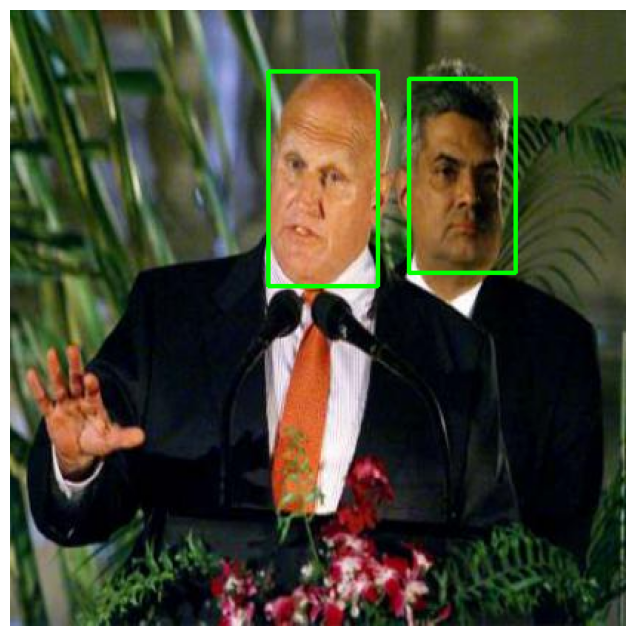

In [34]:
img_df = df[df.file_name == df.file_name.unique()[1]]
img = annotate_image(img_df, images[1]["file_name"],resize=False)

plt.imshow(img)
plt.axis('off');

In [35]:
sample_images = [annotate_image(df[df.file_name == f], f) for f in df.file_name.unique()[:10]]
sample_images = torch.as_tensor(sample_images)

<ipython-input-35-59d149cbde77>:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  sample_images = torch.as_tensor(sample_images)


In [36]:
sample_images.shape

torch.Size([10, 416, 416, 3])

In [37]:
sample_images = sample_images.permute(0, 3, 1, 2)

In [38]:
sample_images.shape

torch.Size([10, 3, 416, 416])

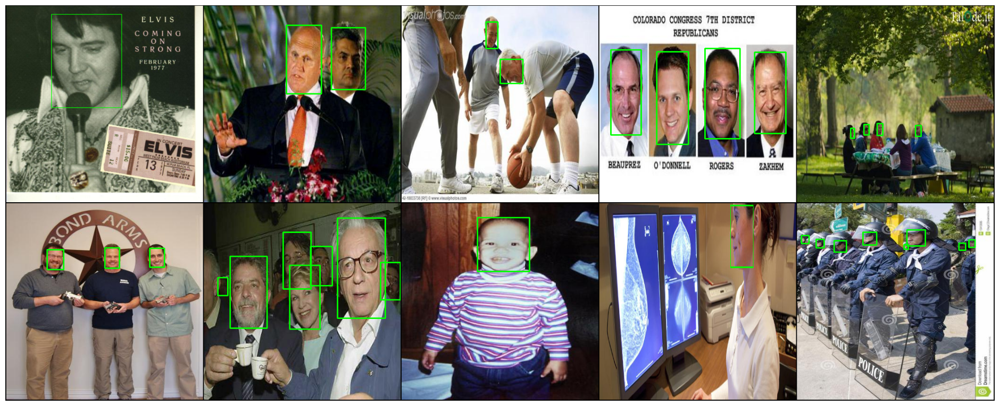

In [39]:
plt.figure(figsize=(24, 12))
grid_img = torchvision.utils.make_grid(sample_images, nrow=5)

plt.imshow(grid_img.permute(1, 2, 0))
plt.axis('off');

## Face Detection with Detectron 2

Time to fine tuning our model ;)

In [40]:
df = pd.read_csv('_annotations.coco.csv')

IMAGES_PATH = f'/content/drive/My Drive/OtherDataset/Facedetection.v1-fddb.coco/train/'
unique_files = df.image_id.unique()

train_files = set(np.random.choice(unique_files, int(len(unique_files) * 0.95), replace=False))
train_df = df[df.image_id.isin(train_files)]
test_df = df[~df.image_id.isin(train_files)]

train_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name,image_id
0,18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...,1024,1038,0,0,NaN,NaN,face,0
1,18_Concerts_Concerts_18_366_jpg.rf.009e25def2b...,1024,1038,235,45,600.0,538.0,face,0
2,img_680_jpg.rf.005e535e0a9ec17d0859422282d5781...,416,416,174,41,248.0,186.0,face,1
3,img_680_jpg.rf.005e535e0a9ec17d0859422282d5781...,416,416,269,46,341.0,177.0,face,1
4,35_Basketball_playingbasketball_35_276_jpg.rf....,416,416,208,113,256.0,164.0,face,2


Couldn't use train_test_split here, cause we want split among file names.

In [41]:
classes = df.class_name.unique().tolist()

Converting data to JSON format

In [54]:
import itertools
import pandas as pd
from detectron2.structures import BoxMode

def create_dataset_dicts(df, classes):
    dataset_dicts = []
    for image_id, img_name in enumerate(df.file_name.unique()):
        record = {}

        image_df = df[df.file_name == img_name]

        file_path = f'{IMAGES_PATH}/{img_name}'
        record["file_name"] = file_path
        record["image_id"] = image_id
        record["height"] = int(image_df.iloc[0].height)
        record["width"] = int(image_df.iloc[0].width)

        objs = []
        for _, row in image_df.iterrows():
            # Skip rows with NaN values
            if pd.notna(row.x_min) and pd.notna(row.y_min) and pd.notna(row.x_max) and pd.notna(row.y_max):
                xmin = int(row.x_min)
                ymin = int(row.y_min)
                xmax = int(row.x_max)
                ymax = int(row.y_max)

                poly = [
                    (xmin, ymin), (xmax, ymin),
                    (xmax, ymax), (xmin, ymax)
                ]
                poly = list(itertools.chain.from_iterable(poly))

                obj = {
                    "bbox": [xmin, ymin, xmax, ymax],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation": [poly],
                    "category_id": classes.index(row.class_name),
                    "iscrowd": 0
                }
                objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts


You should notice cool rectangle bounding boxes. This is required for the image segmentation models in Detectron2.

Register your dataset into the dataset and metadata catalogues, now:

In [43]:
for d in ["train", "val"]:
  DatasetCatalog.register("faces_" + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
  MetadataCatalog.get("faces_" + d).set(thing_classes=classes)

statement_metadata = MetadataCatalog.get("faces_train")

In [44]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

The evaluation results will be stored in the `coco_eval`.
 😂

In [45]:
cfg = get_cfg()

cfg.merge_from_file(
  model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
  )
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
  "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
)

Our datasets

In [46]:
cfg.DATASETS.TRAIN = ("faces_train",)
cfg.DATASETS.TEST = ("faces_val",)
cfg.DATALOADER.NUM_WORKERS = 4

And for the optimizer, we'll do a bit of magic

In [56]:
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000,)
cfg.SOLVER.GAMMA = 0.05

In [58]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 500

Train, now..... or now, Train! or or or TRAIN

In [59]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/02 23:44:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:01, 222MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/02 23:44:49 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/02 23:45:01 d2.utils.events]:  eta: 0:08:16  iter: 19  total_loss: 2.201  loss_cls: 0.6565  loss_box_reg: 0.3951  loss_mask: 0.6961  loss_rpn_cls: 0.3499  loss_rpn_loc: 0.1007    time: 0.3578  last_time: 0.2562  data_time: 0.0523  last_data_time: 0.0248   lr: 1.931e-06  max_mem: 10750M
[05/02 23:45:10 d2.utils.events]:  eta: 0:06:56  iter: 39  total_loss: 2.107  loss_cls: 0.6435  loss_box_reg: 0.3378  loss_mask: 0.6897  loss_rpn_cls: 0.2438  loss_rpn_loc: 0.02883    time: 0.3377  last_time: 0.2716  data_time: 0.0245  last_data_time: 0.0082   lr: 2.911e-06  max_mem: 10750M
[05/02 23:45:18 d2.utils.events]:  eta: 0:06:35  iter: 59  total_loss: 2.174  loss_cls: 0.6142  loss_box_reg: 0.3352  loss_mask: 0.6799  loss_rpn_cls: 0.2642  loss_rpn_loc: 0.05554    time: 0.3523  last_time: 0.2530  data_time: 0.0728  last_data_time: 0.0039   lr: 3.891e-06  max_mem: 10750M
[05/02 23:45:25 d2.utils.events]:  eta: 0:06:35  iter: 79  total_loss: 2.069  loss_cls: 0.5878  loss_box_reg: 0.3509  loss_ma

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 23:48:05 d2.evaluation.evaluator]: Inference done 11/260. Dataloading: 0.0009 s/iter. Inference: 0.1132 s/iter. Eval: 0.0824 s/iter. Total: 0.1966 s/iter. ETA=0:00:48
[05/02 23:48:10 d2.evaluation.evaluator]: Inference done 36/260. Dataloading: 0.0014 s/iter. Inference: 0.1016 s/iter. Eval: 0.0971 s/iter. Total: 0.2002 s/iter. ETA=0:00:44
[05/02 23:48:15 d2.evaluation.evaluator]: Inference done 53/260. Dataloading: 0.0014 s/iter. Inference: 0.1060 s/iter. Eval: 0.1280 s/iter. Total: 0.2356 s/iter. ETA=0:00:48
[05/02 23:48:20 d2.evaluation.evaluator]: Inference done 84/260. Dataloading: 0.0015 s/iter. Inference: 0.1019 s/iter. Eval: 0.1045 s/iter. Total: 0.2080 s/iter. ETA=0:00:36
[05/02 23:48:25 d2.evaluation.evaluator]: Inference done 110/260. Dataloading: 0.0015 s/iter. Inference: 0.1018 s/iter. Eval: 0.1012 s/iter. Total: 0.2045 s/iter. ETA=0:00:30
[05/02 23:48:30 d2.evaluation.evaluator]: Inference done 137/260. Dataloading: 0.0014 s/iter. Inference: 0.1014 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 23:52:43 d2.evaluation.evaluator]: Inference done 11/260. Dataloading: 0.0008 s/iter. Inference: 0.1180 s/iter. Eval: 0.0667 s/iter. Total: 0.1855 s/iter. ETA=0:00:46
[05/02 23:52:49 d2.evaluation.evaluator]: Inference done 39/260. Dataloading: 0.0014 s/iter. Inference: 0.1139 s/iter. Eval: 0.0695 s/iter. Total: 0.1849 s/iter. ETA=0:00:40
[05/02 23:52:54 d2.evaluation.evaluator]: Inference done 64/260. Dataloading: 0.0014 s/iter. Inference: 0.1139 s/iter. Eval: 0.0765 s/iter. Total: 0.1920 s/iter. ETA=0:00:37
[05/02 23:52:59 d2.evaluation.evaluator]: Inference done 93/260. Dataloading: 0.0014 s/iter. Inference: 0.1130 s/iter. Eval: 0.0714 s/iter. Total: 0.1860 s/iter. ETA=0:00:31
[05/02 23:53:04 d2.evaluation.evaluator]: Inference done 117/260. Dataloading: 0.0014 s/iter. Inference: 0.1128 s/iter. Eval: 0.0769 s/iter. Total: 0.1912 s/iter. ETA=0:00:27
[05/02 23:53:09 d2.evaluation.evaluator]: Inference done 149/260. Dataloading: 0.0015 s/iter. Inference: 0.1131 s/iter. Eval: 0.0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 23:57:37 d2.evaluation.evaluator]: Inference done 11/260. Dataloading: 0.0009 s/iter. Inference: 0.1231 s/iter. Eval: 0.0153 s/iter. Total: 0.1394 s/iter. ETA=0:00:34
[05/02 23:57:42 d2.evaluation.evaluator]: Inference done 45/260. Dataloading: 0.0014 s/iter. Inference: 0.1219 s/iter. Eval: 0.0237 s/iter. Total: 0.1472 s/iter. ETA=0:00:31
[05/02 23:57:47 d2.evaluation.evaluator]: Inference done 75/260. Dataloading: 0.0014 s/iter. Inference: 0.1228 s/iter. Eval: 0.0345 s/iter. Total: 0.1589 s/iter. ETA=0:00:29
[05/02 23:57:52 d2.evaluation.evaluator]: Inference done 111/260. Dataloading: 0.0014 s/iter. Inference: 0.1216 s/iter. Eval: 0.0303 s/iter. Total: 0.1535 s/iter. ETA=0:00:22
[05/02 23:57:57 d2.evaluation.evaluator]: Inference done 142/260. Dataloading: 0.0015 s/iter. Inference: 0.1211 s/iter. Eval: 0.0330 s/iter. Total: 0.1557 s/iter. ETA=0:00:18
[05/02 23:58:02 d2.evaluation.evaluator]: Inference done 179/260. Dataloading: 0.0015 s/iter. Inference: 0.1206 s/iter. Eval: 0.

## Evaluating Object Detection Models

Evaluating object detection models is a bit different when compared to evaluating standard classification or regression models.

The main metric you need to know about is IoU (intersection over union). It measures the overlap between two boundaries - the predicted and ground truth one. It can get values between 0 and 1.

$$\text{IoU}=\frac{\text{area of overlap}}{\text{area of union}}$$

Using IoU, one can define a threshold (e.g. >0.5) to classify whether a prediction is a true positive (TP) or a false positive (FP).

Now you can calculate average precision (AP) by taking the area under the precision-recall curve.

Now AP@X (e.g. AP50) is just AP at some IoU threshold. This should give you a working understanding of how object detection models are evaluated.

(https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173)

In [60]:
%load_ext tensorboard

In [61]:
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [64]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

[05/03 00:01:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Evaluator with the trained model:

In [65]:
evaluator = COCOEvaluator("faces_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "faces_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/03 00:01:58 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/03 00:01:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/03 00:01:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/03 00:01:59 d2.data.common]: Serializing 260 elements to byte tensors and concatenating them all ...
[05/03 00:01:59 d2.data.common]: Serialized dataset takes 0.18 MiB
[05/03 00:01:59 d2.evaluation.evaluator]: Start inference on 260 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/03 00:02:01 d2.evaluation.evaluator]: Inference done 11/260. Dataloading: 0.0008 s/iter. Inference: 0.1201 s/iter. Eval: 0.0163 s/iter. Total: 0.1372 s/iter. ETA=0:00:34
[05/03 00:02:06 d2.evaluation.evaluator]: Inference done 45/260. Dataloading: 0.0015 s/iter. Inference: 0.1236 s/iter. Eval: 0.0234 s/iter. Total: 0.1486 s/iter. ETA=0:00:31
[05/03 00:02:11 d2.evaluation.evaluator]: Inference done 75/260. Dataloading: 0.0015 s/iter. Inference: 0.1242 s/iter. Eval: 0.0343 s/iter. Total: 0.1601 s/iter. ETA=0:00:29
[05/03 00:02:16 d2.evaluation.evaluator]: Inference done 110/260. Dataloading: 0.0015 s/iter. Inference: 0.1235 s/iter. Eval: 0.0302 s/iter. Total: 0.1553 s/iter. ETA=0:00:23
[05/03 00:02:21 d2.evaluation.evaluator]: Inference done 140/260. Dataloading: 0.0015 s/iter. Inference: 0.1233 s/iter. Eval: 0.0331 s/iter. Total: 0.1580 s/iter. ETA=0:00:18
[05/03 00:02:26 d2.evaluation.evaluator]: Inference done 177/260. Dataloading: 0.0015 s/iter. Inference: 0.1229 s/iter. Eval: 0.

OrderedDict([('bbox',
              {'AP': 18.09454940252054,
               'AP50': 39.19142496894434,
               'AP75': 14.587427642693937,
               'APs': 8.383681198193706,
               'APm': 37.69301942478449,
               'APl': 58.46798014583785}),
             ('segm',
              {'AP': 17.272759634317733,
               'AP50': 39.00783510376581,
               'AP75': 12.718989361947797,
               'APs': 8.549957564607322,
               'APm': 35.93341221503711,
               'APl': 52.214338078064856})])

### Finding Faces in Images
Making a folder, and saving all images with image annotation predictions

In [66]:
os.makedirs("annotated_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [67]:
for clothing_image in test_image_paths:
  file_path = f'{IMAGES_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata,
    scale=1.,
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'annotated_results/{file_name}', result)

Let's have a looksie:

In [68]:
annotated_images = [f'annotated_results/{f}' for f in test_df.file_name.unique()]

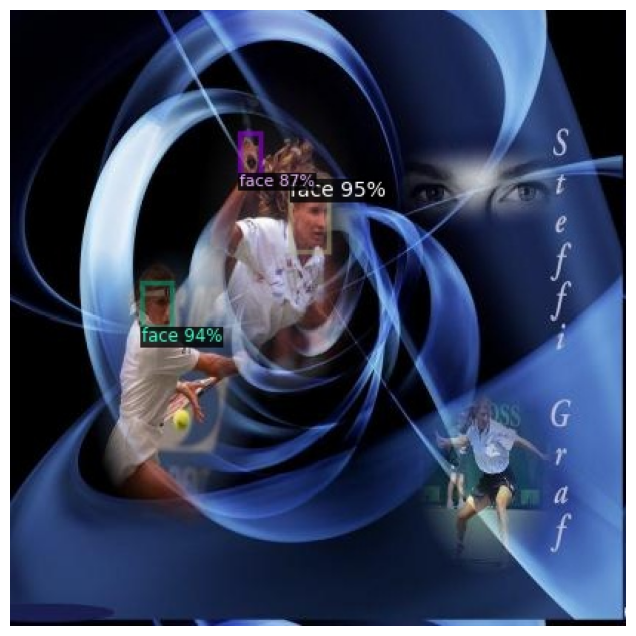

In [69]:
img = cv2.cvtColor(cv2.imread(annotated_images[0]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

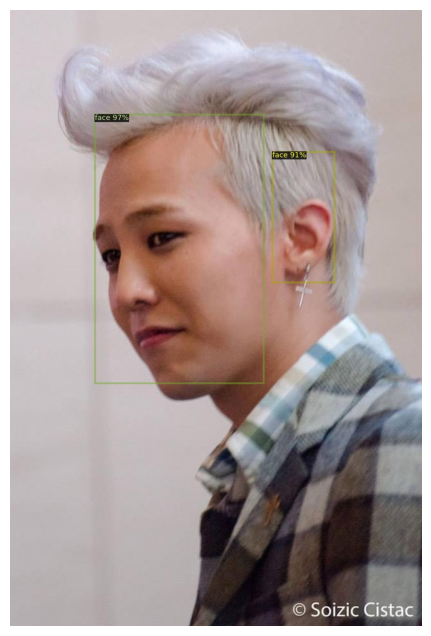

In [70]:
img = cv2.cvtColor(cv2.imread(annotated_images[1]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

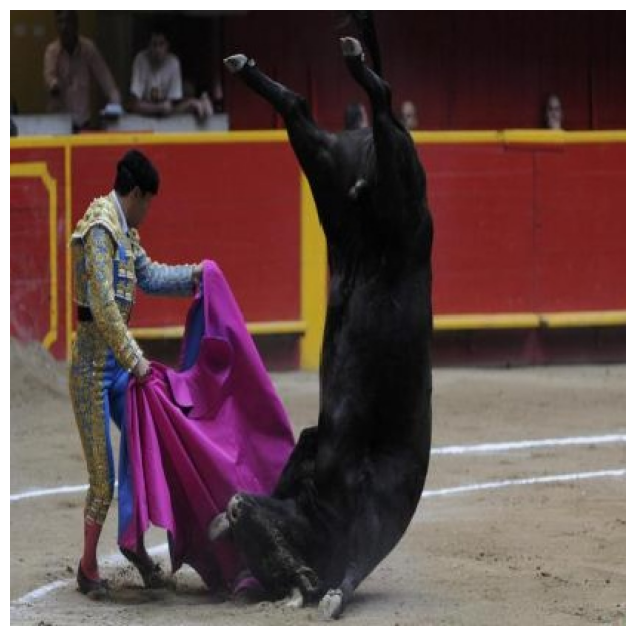

In [71]:
img = cv2.cvtColor(cv2.imread(annotated_images[3]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

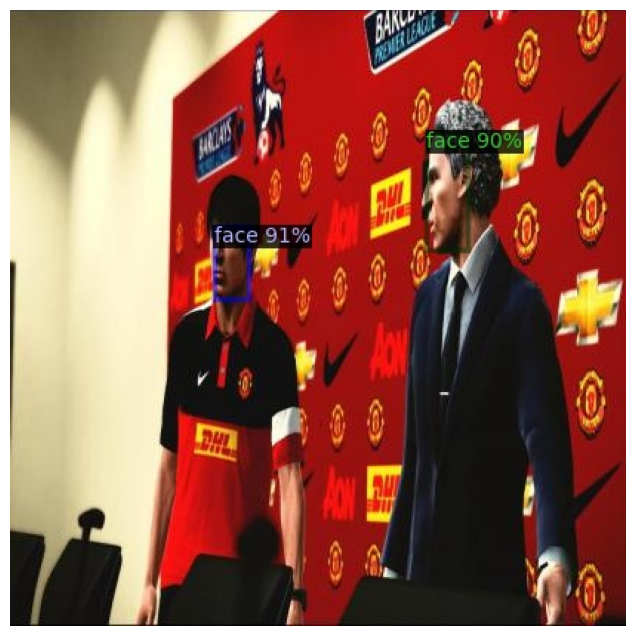

In [72]:
img = cv2.cvtColor(cv2.imread(annotated_images[4]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');